In [68]:
import sys
sys.path.append('/kaggle/input/bottleneck-installer')
import bottleneck

import pandas as pd
import numpy as np
import os
import psutil  
import random

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers.legacy import Adam 

from pathlib import Path
import shutil
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from functools import lru_cache
from pympler import asizeof

import typing
from dataclasses import dataclass
from collections.abc import Callable
from collections.abc import Sequence

from keras.callbacks import Callback
from sklearn.metrics import f1_score, roc_auc_score

import itertools

In [69]:
SUBMISSION = True
#SUBMISSION = False
VALIDATION_FRAC = None
VALIDATION_FRAC = 0.05
USE_GPU = False
USE_TPU = False # = True not tested yet

In [70]:
ROOT_DIR = '/Users/koushani/Documents/UB-COURSEWORK/SPRING24/XAI_HMS_KAGGLE/CODING/DATA'
TRAIN_EEGS = os.path.join(ROOT_DIR , 'train_eegs')
TRAIN_SPECTR =  os.path.join(ROOT_DIR, 'train_spectrograms')
TEST_EEGS = os.path.join(ROOT_DIR, 'test_eegs')
TEST_SPECTR = os.path.join(ROOT_DIR, 'test_spectrograms')

In [71]:
ADAM_LEARNING_RATE = 0.0001


In [72]:
EEG_ONLY_MODEL = True

In [73]:
DEBUG = False
DEBUG = True

if SUBMISSION:
    DEBUG = False
    
DEBUG_TRAIN_SIZE = 512 # take only DEBUG_TRAIN_SIZE entries from test when DEBUG = True

SKIP_ASSERT = SUBMISSION or not DEBUG
#SKIP_ASSERT = True

In [74]:
NUM_EPOCHS = 5
NUM_SUB_EPOCHS = 2  # Each epoch is divided into 2 parts, so effectively 10 training phases
BATCH_SIZE = 128

In [75]:
EEG_FRAME_PER_SECOND = 200
EEG_FRAME = 50 * EEG_FRAME_PER_SECOND
SPECTR_FRAME = 10 * 60 // 2

In [76]:
EEG_FILTER_PERIOD = 11
EEG_FILTER_BASE_PERIOD = EEG_FILTER_PERIOD * 20

EEG_WINDOW_IN_SEC = 10 # in seconds
EEG_WINDOW = EEG_WINDOW_IN_SEC * EEG_FRAME_PER_SECOND # in ticks
EEG_MODEL_WINDOW = EEG_WINDOW // 2

In [77]:
def size_2_str(value):
    if value < 5 * 1024:
        return str(value) + ' bytes'
    if value < 5 * 1024 * 1024:
        return str(value//1024) + ' KB'
    return str(value//(1024*1024)) +' MB'

def get_mem_usage():
    pid = os.getpid()
    py = psutil.Process(pid)
    return py.memory_info()[0] // 2 ** 20

In [78]:
EEG_COLUMNS =  [ # to assert columns order is the same
    'Fp1','F3', 'C3', 'P3', 'F7', 
    'T3', 'T5', 'O1', 'Fz', 'Cz', 
    'Pz', 'Fp2', 'F4', 'C4', 'P4',
    'F8', 'T4', 'T6', 'O2', 'EKG'
]

In [79]:
EEG_FEATURES = EEG_COLUMNS # [ 'EKG' ]

In [80]:
SPECTR_COLUMNS = [ # to assert columns order is the same
    'time',
    'LL_0.59', 'LL_0.78', 'LL_0.98', 'LL_1.17', 'LL_1.37', 
    'LL_1.56', 'LL_1.76', 'LL_1.95', 'LL_2.15', 'LL_2.34', 
    'LL_2.54', 'LL_2.73', 'LL_2.93', 'LL_3.13', 'LL_3.32', 
    'LL_3.52', 'LL_3.71', 'LL_3.91', 'LL_4.1', 'LL_4.3', 
    'LL_4.49', 'LL_4.69', 'LL_4.88', 'LL_5.08', 'LL_5.27', 
    'LL_5.47', 'LL_5.66', 'LL_5.86', 'LL_6.05', 'LL_6.25', 
    'LL_6.45', 'LL_6.64', 'LL_6.84', 'LL_7.03', 'LL_7.23', 
    'LL_7.42', 'LL_7.62', 'LL_7.81', 'LL_8.01', 'LL_8.2', 
    'LL_8.4', 'LL_8.59', 'LL_8.79', 'LL_8.98', 'LL_9.18', 
    'LL_9.38', 'LL_9.57', 'LL_9.77', 'LL_9.96', 'LL_10.16', 
    'LL_10.35', 'LL_10.55', 'LL_10.74', 'LL_10.94', 'LL_11.13', 
    'LL_11.33', 'LL_11.52', 'LL_11.72', 'LL_11.91', 'LL_12.11', 
    'LL_12.3', 'LL_12.5', 'LL_12.7', 'LL_12.89', 'LL_13.09', 
    'LL_13.28', 'LL_13.48', 'LL_13.67', 'LL_13.87', 'LL_14.06', 
    'LL_14.26', 'LL_14.45', 'LL_14.65', 'LL_14.84', 'LL_15.04', 
    'LL_15.23', 'LL_15.43', 'LL_15.63', 'LL_15.82', 'LL_16.02', 
    'LL_16.21', 'LL_16.41', 'LL_16.6', 'LL_16.8', 'LL_16.99', 
    'LL_17.19', 'LL_17.38', 'LL_17.58', 'LL_17.77', 'LL_17.97', 
    'LL_18.16', 'LL_18.36', 'LL_18.55', 'LL_18.75', 'LL_18.95', 
    'LL_19.14', 'LL_19.34', 'LL_19.53', 'LL_19.73', 'LL_19.92', 
    'RL_0.59', 'RL_0.78', 'RL_0.98', 'RL_1.17', 'RL_1.37', 
    'RL_1.56', 'RL_1.76', 'RL_1.95', 'RL_2.15', 'RL_2.34', 
    'RL_2.54', 'RL_2.73', 'RL_2.93', 'RL_3.13', 'RL_3.32', 
    'RL_3.52', 'RL_3.71', 'RL_3.91', 'RL_4.1', 'RL_4.3', 
    'RL_4.49', 'RL_4.69', 'RL_4.88', 'RL_5.08', 'RL_5.27', 
    'RL_5.47', 'RL_5.66', 'RL_5.86', 'RL_6.05', 'RL_6.25', 
    'RL_6.45', 'RL_6.64', 'RL_6.84', 'RL_7.03', 'RL_7.23', 
    'RL_7.42', 'RL_7.62', 'RL_7.81', 'RL_8.01', 'RL_8.2', 
    'RL_8.4', 'RL_8.59', 'RL_8.79', 'RL_8.98', 'RL_9.18', 
    'RL_9.38', 'RL_9.57', 'RL_9.77', 'RL_9.96', 'RL_10.16', 
    'RL_10.35', 'RL_10.55', 'RL_10.74', 'RL_10.94', 'RL_11.13', 
    'RL_11.33', 'RL_11.52', 'RL_11.72', 'RL_11.91', 'RL_12.11', 
    'RL_12.3', 'RL_12.5', 'RL_12.7', 'RL_12.89', 'RL_13.09', 
    'RL_13.28', 'RL_13.48', 'RL_13.67', 'RL_13.87', 'RL_14.06', 
    'RL_14.26', 'RL_14.45', 'RL_14.65', 'RL_14.84', 'RL_15.04', 
    'RL_15.23', 'RL_15.43', 'RL_15.63', 'RL_15.82', 'RL_16.02', 
    'RL_16.21', 'RL_16.41', 'RL_16.6', 'RL_16.8', 'RL_16.99',
    'RL_17.19', 'RL_17.38', 'RL_17.58', 'RL_17.77', 'RL_17.97', 
    'RL_18.16', 'RL_18.36', 'RL_18.55', 'RL_18.75', 'RL_18.95', 
    'RL_19.14', 'RL_19.34', 'RL_19.53', 'RL_19.73', 'RL_19.92', 
    'LP_0.59', 'LP_0.78', 'LP_0.98', 'LP_1.17', 'LP_1.37', 
    'LP_1.56', 'LP_1.76', 'LP_1.95', 'LP_2.15', 'LP_2.34', 
    'LP_2.54', 'LP_2.73', 'LP_2.93', 'LP_3.13', 'LP_3.32', 
    'LP_3.52', 'LP_3.71', 'LP_3.91', 'LP_4.1', 'LP_4.3', 
    'LP_4.49', 'LP_4.69', 'LP_4.88', 'LP_5.08', 'LP_5.27', 
    'LP_5.47', 'LP_5.66', 'LP_5.86', 'LP_6.05', 'LP_6.25', 
    'LP_6.45', 'LP_6.64', 'LP_6.84', 'LP_7.03', 'LP_7.23', 
    'LP_7.42', 'LP_7.62', 'LP_7.81', 'LP_8.01', 'LP_8.2', 
    'LP_8.4', 'LP_8.59', 'LP_8.79', 'LP_8.98', 'LP_9.18', 
    'LP_9.38', 'LP_9.57', 'LP_9.77', 'LP_9.96', 'LP_10.16', 
    'LP_10.35', 'LP_10.55', 'LP_10.74', 'LP_10.94', 'LP_11.13',
    'LP_11.33', 'LP_11.52', 'LP_11.72', 'LP_11.91', 'LP_12.11', 
    'LP_12.3', 'LP_12.5', 'LP_12.7', 'LP_12.89', 'LP_13.09', 
    'LP_13.28', 'LP_13.48', 'LP_13.67', 'LP_13.87', 'LP_14.06', 
    'LP_14.26', 'LP_14.45', 'LP_14.65', 'LP_14.84', 'LP_15.04', 
    'LP_15.23', 'LP_15.43', 'LP_15.63', 'LP_15.82', 'LP_16.02', 
    'LP_16.21', 'LP_16.41', 'LP_16.6', 'LP_16.8', 'LP_16.99', 
    'LP_17.19', 'LP_17.38', 'LP_17.58', 'LP_17.77', 'LP_17.97', 
    'LP_18.16', 'LP_18.36', 'LP_18.55', 'LP_18.75', 'LP_18.95', 
    'LP_19.14', 'LP_19.34', 'LP_19.53', 'LP_19.73', 'LP_19.92', 
    'RP_0.59', 'RP_0.78', 'RP_0.98', 'RP_1.17', 'RP_1.37', 
    'RP_1.56', 'RP_1.76', 'RP_1.95', 'RP_2.15', 'RP_2.34', 
    'RP_2.54', 'RP_2.73', 'RP_2.93', 'RP_3.13', 'RP_3.32', 
    'RP_3.52', 'RP_3.71', 'RP_3.91', 'RP_4.1', 'RP_4.3', 
    'RP_4.49', 'RP_4.69', 'RP_4.88', 'RP_5.08', 'RP_5.27', 
    'RP_5.47', 'RP_5.66', 'RP_5.86', 'RP_6.05', 'RP_6.25', 
    'RP_6.45', 'RP_6.64', 'RP_6.84', 'RP_7.03', 'RP_7.23', 
    'RP_7.42', 'RP_7.62', 'RP_7.81', 'RP_8.01', 'RP_8.2', 
    'RP_8.4', 'RP_8.59', 'RP_8.79', 'RP_8.98', 'RP_9.18', 
    'RP_9.38', 'RP_9.57', 'RP_9.77', 'RP_9.96', 'RP_10.16', 
    'RP_10.35', 'RP_10.55', 'RP_10.74', 'RP_10.94', 'RP_11.13', 
    'RP_11.33', 'RP_11.52', 'RP_11.72', 'RP_11.91', 'RP_12.11', 
    'RP_12.3', 'RP_12.5', 'RP_12.7', 'RP_12.89', 'RP_13.09', 
    'RP_13.28', 'RP_13.48', 'RP_13.67', 'RP_13.87', 'RP_14.06', 
    'RP_14.26', 'RP_14.45', 'RP_14.65', 'RP_14.84', 'RP_15.04', 
    'RP_15.23', 'RP_15.43', 'RP_15.63', 'RP_15.82', 'RP_16.02', 
    'RP_16.21', 'RP_16.41', 'RP_16.6', 'RP_16.8', 'RP_16.99', 
    'RP_17.19', 'RP_17.38', 'RP_17.58', 'RP_17.77', 'RP_17.97', 
    'RP_18.16', 'RP_18.36', 'RP_18.55', 'RP_18.75', 'RP_18.95',
    'RP_19.14', 'RP_19.34', 'RP_19.53', 'RP_19.73', 'RP_19.92'
]


In [81]:
VOTE_COLUMNS = [
    'seizure_vote',
    'lpd_vote',
    'gpd_vote',
    'lrda_vote',
    'grda_vote',
    'other_vote'
]

In [82]:
TARGET_FEATURES = VOTE_COLUMNS

In [83]:
SPECTR_FEATURES = list([x for x in SPECTR_COLUMNS if x != 'time'])

In [84]:
def scale_probs(probs):
    s = np.sum(probs, axis = -1, keepdims = True)
    return probs/s

In [85]:
def filter_eeg_signals(data):
    # Ensure data contains at least one complete window for filtering if data is very small
    if len(data) < EEG_WINDOW:
        data = np.pad(data, ((0, EEG_WINDOW - len(data)), (0, 0)), 'constant')


    # Applying the baseline correction
    base_mean = bottleneck.move_mean(data, window=EEG_FILTER_BASE_PERIOD, min_count=1, axis=0)
    data -= base_mean

    # Smoothing with a smaller moving average window
    data = bottleneck.move_mean(data, window=EEG_FILTER_PERIOD, min_count=1, axis=0)

    # Normalizing each channel independently
    total_max = np.max(np.abs(data), axis=0)
    total_max[total_max == 0] = 1  # prevent division by zero
    data /= total_max

    # Optionally resampling the data to fit the model window
    if len(data) > EEG_MODEL_WINDOW:
        start_idx = (len(data) - EEG_MODEL_WINDOW) // 2
        end_idx = start_idx + EEG_MODEL_WINDOW
        data = data[start_idx:end_idx]

    return data

In [86]:
def decrease_int_type(column):
    try:
        new_column = column.astype('int8')
        if new_column.astype(column.dtype).equals(column):
            return new_column
    except Exception:
        pass
    try:
        new_column = column.astype('int16')
        if new_column.astype(column.dtype).equals(column):
            return new_column
    except Exception:
        pass
    try:
        new_column = column.astype('int32')
        if new_column.astype(column.dtype).equals(column):
            return new_column
    except Exception:
        pass
    return column

In [87]:
def load_train_eeg_frame(id):
    # Ensure the ID is an integer to avoid issues with file name construction
    id = int(id)
    # Construct the file path using the integer ID
    file_path = os.path.join(TRAIN_EEGS, f'{id}.parquet')
    # Load the EEG data from the specified Parquet file
    data = pd.read_parquet(file_path, engine='pyarrow')
    # Optional: Verify that the columns match expected EEG columns
    if not SKIP_ASSERT:
        assert list(data.columns) == EEG_COLUMNS, 'EEG columns order is not the same!'
    return data

def load_train_spectr_frame(id):
    # Ensure the ID is an integer to prevent file path errors
    id = int(id)
    # Construct the file path using the integer ID
    file_path = os.path.join(TRAIN_SPECTR, f'{id}.parquet')
    # Load the spectrogram data from the specified Parquet file
    data = pd.read_parquet(file_path, engine='pyarrow')
    # Optional: Verify that the columns match expected Spectrogram columns
    if not SKIP_ASSERT:
        assert list(data.columns) == SPECTR_COLUMNS, 'Spectrogram columns order is not the same!'
    return data
    
def load_test_eeg_frame(id):
    data = pd.read_parquet(
        os.path.join(TEST_EEGS, str(id) + '.parquet'), 
        engine='pyarrow'
    )
    if not SKIP_ASSERT:
        assert list(data.columns) == EEG_COLUMNS, 'EEG columns order is not the same!'
    return data

def load_test_spectr_frame(id):
    data = pd.read_parquet(
        os.path.join(TEST_SPECTR, str(id) + '.parquet'), 
        engine='pyarrow'
    )
    if not SKIP_ASSERT:
        assert list(data.columns) == SPECTR_COLUMNS, 'SPECTR columns order is not the same!'
    return data

In [88]:
def inspect_and_plot_spectrogram(spectr_id):
    spectr_data = load_train_spectr_frame(spectr_id)
    total_frames = len(spectr_data)
    total_duration_in_seconds = 10 * 60  # 10 minutes converted to seconds
    frame_rate = total_frames / total_duration_in_seconds
    print(f"Total frames: {total_frames}, Estimated frame rate: {frame_rate:.2f} frames per second")
    
    # Plotting the spectrogram
    plt.figure(figsize=(12, 8))
    # Assuming spectrogram data has columns named after frequencies and sides (e.g., 'LL_0.59', 'RL_0.59')
    # We'll select a few representative frequencies across different regions to plot
    frequencies_to_plot = ['LL_0.59', 'LL_5.08', 'RL_0.59', 'RL_5.08']
    for freq in frequencies_to_plot:
        if freq in spectr_data.columns:
            plt.plot(spectr_data[freq], label=freq)
    
    plt.title(f'Spectrogram Visualization for ID: {spectr_id}')
    plt.xlabel('Time Frames')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()

    return frame_rate

Total frames: 301, Estimated frame rate: 0.50 frames per second


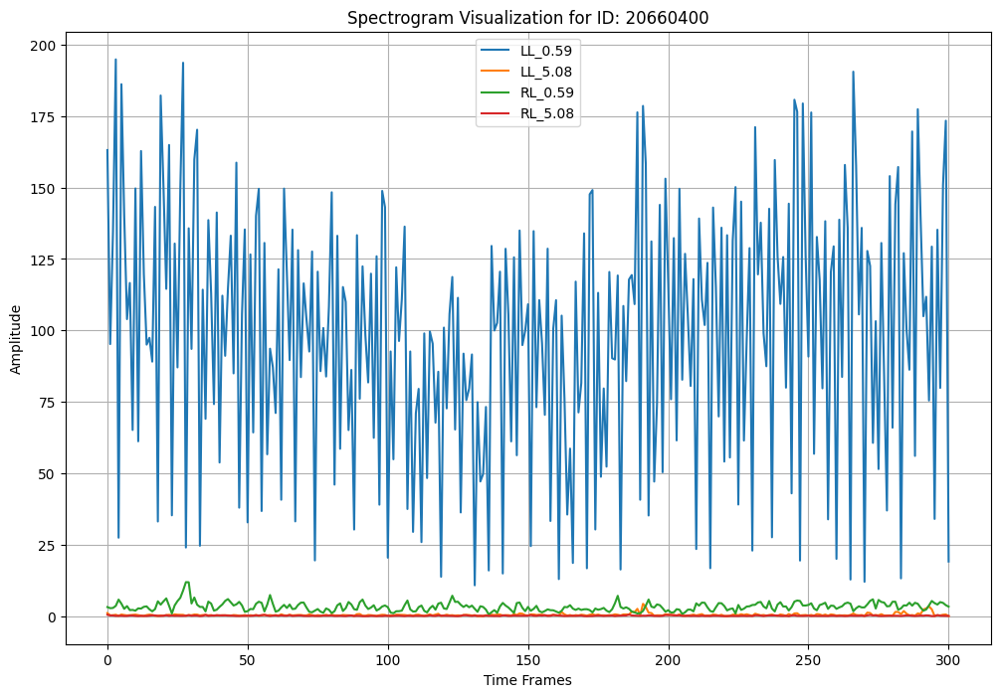

Spectrogram frame rate is:  0.5016666666666667


In [89]:
spectr_frame_rate = inspect_and_plot_spectrogram(20660400)
print("Spectrogram frame rate is: ",spectr_frame_rate )

In [90]:
SPECTR_FRAME_PER_SECOND = spectr_frame_rate

In [91]:
def extract_segments(eeg_data, spectrogram_data, eeg_offset_seconds, spectr_offset_seconds):
    # Extract EEG segment
    eeg_start = int(eeg_offset_seconds * EEG_FRAME_PER_SECOND)
    eeg_end = eeg_start + (10 * EEG_FRAME_PER_SECOND)  # 10-second window
    eeg_segment = eeg_data[eeg_start:eeg_end]
    
    # Extract Spectrogram segment
    # Each frame is 2 seconds, we need 5 frames for 10 seconds
    spectr_start = int(spectr_offset_seconds / 2)
    spectr_end = spectr_start + 5  # 5 frames for 10 seconds
    spectrogram_segment = spectrogram_data[spectr_start:spectr_end]
    
    return eeg_segment, spectrogram_segment

In [92]:
metadata = pd.read_csv('/Users/koushani/Documents/UB-COURSEWORK/SPRING24/XAI_HMS_KAGGLE/CODING/DATA/train.csv')

# Convert ID columns to integers
metadata['eeg_id'] = metadata['eeg_id'].astype(int)
metadata['spectrogram_id'] = metadata['spectrogram_id'].astype(int)

# Check the data types
print(metadata.dtypes)

eeg_id                                int64
eeg_sub_id                            int64
eeg_label_offset_seconds            float64
spectrogram_id                        int64
spectrogram_sub_id                    int64
spectrogram_label_offset_seconds    float64
label_id                              int64
patient_id                            int64
expert_consensus                     object
seizure_vote                          int64
lpd_vote                              int64
gpd_vote                              int64
lrda_vote                             int64
grda_vote                             int64
other_vote                            int64
dtype: object


In [93]:
# For example, let's say we are interested in the first entry
row_index = 0
eeg_offset_seconds = metadata.at[row_index, 'eeg_label_offset_seconds']
spectr_offset_seconds = metadata.at[row_index, 'spectrogram_label_offset_seconds']

# Load the actual EEG and Spectrogram data based on IDs
eeg_id = metadata.at[row_index, 'eeg_id']
spectrogram_id = metadata.at[row_index, 'spectrogram_id']

eeg_data = load_train_eeg_frame(eeg_id)  # This should be defined as per your earlier code
spectrogram_data = load_train_spectr_frame(spectrogram_id)  # This should be defined as per your earlier code

# Now extract the segments
eeg_segment, spectrogram_segment = extract_segments(
    eeg_data, spectrogram_data, eeg_offset_seconds, spectr_offset_seconds
)

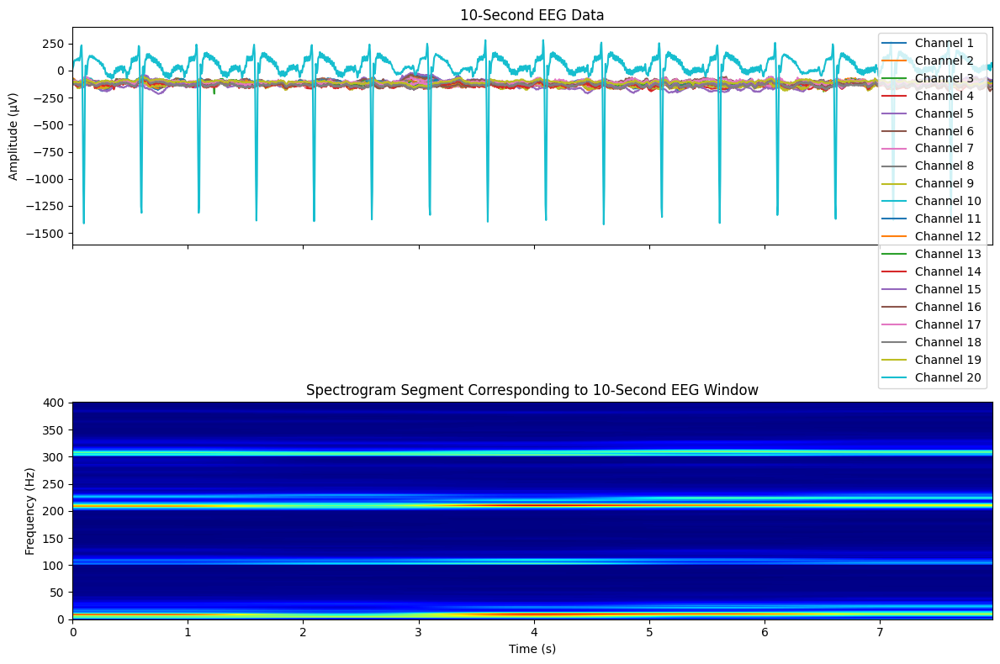

In [94]:
# Plotting
fig, axs = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

# Plot EEG data
for i in range(eeg_data.shape[1]):  # Assuming eeg_data is 2D: time x channels
    axs[0].plot(np.arange(eeg_data.shape[0]) / EEG_FRAME_PER_SECOND, eeg_data.iloc[:, i], label=f'Channel {i+1}')

axs[0].set_title('10-Second EEG Data')
axs[0].set_ylabel('Amplitude (µV)')
axs[0].legend()

# Plot Spectrogram segment
# Assuming spectrogram_segment is a 2D numpy array with shape: time x frequencies
time_points = np.arange(spectrogram_segment.shape[0]) / SPECTR_FRAME_PER_SECOND
# Let's plot the spectrogram as an image
extent = [time_points[0], time_points[-1], 0, spectrogram_segment.shape[1]]
axs[1].imshow(spectrogram_segment.T, aspect='auto', extent=extent, origin='lower', cmap='jet')
axs[1].set_title('Spectrogram Segment Corresponding to 10-Second EEG Window')
axs[1].set_xlabel('Time (s)')
axs[1].set_ylabel('Frequency (Hz)')

plt.tight_layout()
plt.show()


In [95]:
class TrainTargetLoader(Callable):
    def __init__(self, test_info):
        self.data = scale_probs(test_info[TARGET_FEATURES].to_numpy())
        
    def __len__(self):
        return len(self.data)
        
    def __call__(self, index):
        return self.data[index]

In [96]:
def crop_or_pad(data, target_shape, pad_value=0):
    """Crop or pad the data to the target shape."""
    current_shape = data.shape
    new_data = data
    # If current data is larger than target, crop it
    if all(dim >= t_dim for dim, t_dim in zip(current_shape, target_shape)):
        start_dims = [(dim - t_dim) // 2 for dim, t_dim in zip(current_shape, target_shape)]
        end_dims = [start + t for start, t in zip(start_dims, target_shape)]
        slices = tuple(slice(start, end) for start, end in zip(start_dims, end_dims))
        new_data = data[slices]
    # If current data is smaller than target, pad it
    else:
        pad_widths = [(max(0, t_dim - dim) // 2, max(0, t_dim - dim) - max(0, t_dim - dim) // 2) 
                      for dim, t_dim in zip(current_shape, target_shape)]
        new_data = np.pad(data, pad_widths, mode='constant', constant_values=pad_value)
    return new_data

In [97]:
def normalize_data(data):
    """Normalize data to have zero mean and unit variance."""
    mean = np.mean(data)
    std = np.std(data)
    if std == 0:
        return data
    return (data - mean) / std

In [98]:
def fetch_training_info(train_ids):
    # Simulate fetching or constructing detailed training info
    # In practice, replace this with actual data fetching logic
    train_info = {
        'eeg_id': [id for id in train_ids],  # Placeholder logic
        'eeg_offset': [id * 10 for id in train_ids],  # Example offsets
        'spectr_id': [id + 1000 for id in train_ids],  # Example spectrogram IDs
        'spectr_offset': [id * 5 for id in train_ids]  # Example spectrogram offsets
    }
    return pd.DataFrame(train_info)

In [99]:
class TrainEegSpectrogramLoaderMultiModal(Sequence):
    def __init__(self, train_ids,metadata):
        # Assume that metadata is globally accessible or loaded here
        # For example, you can load it from a file if not passed directly
        metadata['eeg_id'] = metadata['eeg_id'].astype(int)
        metadata['spectrogram_id'] = metadata['spectrogram_id'].astype(int)

        # Filter metadata using train_ids
        train_info = metadata[metadata['eeg_id'].isin(train_ids)]

        # Apply decrease_int_type to each relevant column
        self.data = pd.DataFrame({
            'eeg_id': decrease_int_type(train_info['eeg_id']),
            'eeg_offset': decrease_int_type(train_info['eeg_label_offset_seconds']),
            'spectr_id': decrease_int_type(train_info['spectrogram_id']),
            'spectr_offset': decrease_int_type(train_info['spectrogram_label_offset_seconds'])
        })

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        row = self.data.iloc[index]
        eeg_df = load_train_eeg_frame(row['eeg_id'])
        spectr_df = load_train_spectr_frame(row['spectr_id'])
        
        

        eeg_data = eeg_df.to_numpy()
        spectr_data = spectr_df.to_numpy()


        eeg_data = crop_or_pad(eeg_data, (960, 20))  # Adjust target shape as needed
        eeg_data = normalize_data(eeg_data)

        spectr_data = crop_or_pad(spectr_data, (300, 400))  # Adjust target shape as needed
        spectr_data = normalize_data(spectr_data)

        eeg_start = max(int(row['eeg_offset'] * EEG_FRAME_PER_SECOND) - EEG_FILTER_BASE_PERIOD, 0)
        eeg_end = min(int(row['eeg_offset'] * EEG_FRAME_PER_SECOND) + 10 * EEG_FRAME_PER_SECOND + EEG_FILTER_BASE_PERIOD, len(eeg_data))

        if eeg_end - eeg_start < 2 * EEG_FILTER_BASE_PERIOD:
            eeg_data = np.pad(eeg_data, ((EEG_FILTER_BASE_PERIOD, EEG_FILTER_BASE_PERIOD), (0, 0)), 'constant')
            eeg_start += EEG_FILTER_BASE_PERIOD

        filtered_eeg_data = filter_eeg_signals(eeg_data[eeg_start:eeg_end])

        frame_index = int(row['spectr_offset'] / 2)
        spectr_start = max(frame_index - 2, 0)
        spectr_end = min(frame_index + 3, spectr_data.shape[0])

        if spectr_start > spectr_end:
            spectr_start = max(spectr_end - 5, 0)

        filtered_spectr_data = spectr_data[spectr_start:spectr_end]
        return (filtered_eeg_data, filtered_spectr_data)

In [100]:
def load_train(metadata):
    
    # Optionally drop unnecessary columns from the metadata
    metadata.drop(columns=[
        'expert_consensus',
        'eeg_sub_id',
        'spectrogram_sub_id',
        'patient_id',
        'label_id'
    ], inplace=True)

    # Ensure correct data types
    metadata['eeg_id'] = metadata['eeg_id'].astype(int)
    metadata['spectrogram_id'] = metadata['spectrogram_id'].astype(int)
    metadata['eeg_label_offset_seconds'] = metadata['eeg_label_offset_seconds'].astype(int)
    metadata['spectrogram_label_offset_seconds'] = metadata['spectrogram_label_offset_seconds'].astype(int)

    # Prepare a list of train_ids from the metadata, or define it explicitly
    # This could be based on some filtering criteria or simply all IDs in the dataset
    train_ids = metadata['eeg_id'].unique().tolist()  # Example to fetch unique EEG IDs

    # Debugging: Sample the data if in DEBUG mode to reduce size for faster processing
    if DEBUG:
        metadata = metadata.sample(min(DEBUG_TRAIN_SIZE, len(metadata)))

    # Instantiate the multimodal loader with the metadata and train IDs
    train_eeg_spectrogram_loader = TrainEegSpectrogramLoaderMultiModal(train_ids, metadata)
    
    # Assuming TrainTargetLoader can be appropriately initialized with the same metadata
    train_target_loader = TrainTargetLoader(metadata)

    # Return the size of the training data, the data loader, and the target loader
    return (
        len(metadata),
        train_eeg_spectrogram_loader,
        train_target_loader
    )

In [101]:
train_size, train_eeg_spectrogram_loader, train_target_loader = load_train(metadata)

In [102]:
try:
    sample_data = train_eeg_spectrogram_loader[0]  # Attempt to access the first item
    print("Successfully retrieved data:", sample_data)
except TypeError as e:
    print("Failed to retrieve data:", str(e))

Successfully retrieved data: (array([[-1.5375280e-01, -1.6123265e-01, -2.2152038e-01, ...,
        -3.5056940e-01, -1.8403666e-01, -2.6460731e-01],
       [-1.3145074e-01, -1.4693956e-01, -1.8228199e-01, ...,
        -3.6271176e-01, -1.9879681e-01, -2.6233968e-01],
       [-9.9812433e-02, -1.3667265e-01, -2.1810891e-01, ...,
        -3.4802479e-01, -1.9341001e-01, -2.6258188e-01],
       ...,
       [ 1.8088292e-07, -3.4277974e-07, -5.1841567e-07, ...,
        -5.4645255e-07,  4.3621955e-07,  3.7330085e-07],
       [ 1.8088292e-07, -3.4277974e-07, -5.1841567e-07, ...,
        -5.4645255e-07,  4.3621955e-07,  3.7330085e-07],
       [ 1.8088292e-07, -3.4277974e-07, -5.1841567e-07, ...,
        -5.4645255e-07,  4.3621955e-07,  3.7330085e-07]], dtype=float32), array([[ 0.97506032,  0.22390907,  0.20550913, ..., -0.15653713,
        -0.15545478, -0.14138422],
       [ 1.08329537,  0.22282672,  0.38517932, ..., -0.13867835,
        -0.14463127, -0.14571362],
       [ 1.19153042,  0.06209768,

In [103]:
class TestEegLoader(Callable):
    def __init__(self, test_info):
        self.data = test_info
    
    def __call__(self, index):
        eeg_id = self.data['eeg_id'].iloc[index]
        data = load_test_eeg_frame(eeg_id)
        return filter_eeg_signals(data.to_numpy())

In [104]:
class TestSpectrLoader(Callable):
    def __init__(self, test_info):
        self.data = test_info
    
    def __call__(self, index):
        spectr_id = self.data['spectrogram_id'].iloc[index]
        return load_test_spectr_frame(spectr_id).to_numpy()

In [105]:
class TestEegIdLoader(Callable):
    def __init__(self, test_info):
        self.data = test_info
    
    def __call__(self, index):
        eeg_id = self.data['eeg_id'].iloc[index]
        return eeg_id

In [106]:
def load_test():
    test_info = pd.read_csv(os.path.join(ROOT_DIR,'test.csv'))
    
    test_eeg_loader = TestEegLoader(test_info)
    test_spectr_loader = TestSpectrLoader(test_info)
    test_eeg_id_loader = TestEegIdLoader(test_info)
    return len(test_info), test_eeg_loader,  test_spectr_loader, test_eeg_id_loader


In [107]:
class BatchSlicer:
    def __init__(self, length: int, batch_size: int = None, num_batches: int = None):
        assert length >=0, 'invalid length, must be > 0'
        assert (batch_size is None) != (num_batches is None), \
            'one and only one from batch_size and num_batches must be setted'
        assert batch_size is None or batch_size > 0, 'invalid batch_size, must be > 0'
        assert num_batches is None or num_batches > 0, 'invalid num_batches, must be > 0'
        self._length = length
        if num_batches is None:
            self._batch_size = batch_size
            self._num_batches = (self._length + self._batch_size - 1) // self._batch_size
        else:
            self._num_batches = num_batches
            self._batch_size = (self._length + self._num_batches - 1) // self._num_batches
        self._real_batch_size = self._length // self._num_batches
        self._num_full_batches = self._length - self._num_batches * self._real_batch_size 
        self._num_short_batches = self._num_batches - self._num_full_batches
 
    def __getitem__(self, index: int): # return -> range(begin, end)
        if not SKIP_ASSERT:
            assert index>=0 and index < self._num_batches, \
                'invalid batch index ={}, num_batches={}'.format(index, self._num_batches)
        if index < self._num_full_batches:
            begin = index * (self._real_batch_size + 1)
            end = begin + (self._real_batch_size + 1)
        else:
            begin = self._num_full_batches * ( self._real_batch_size + 1) + \
                (index - self._num_full_batches) * (self._real_batch_size)
            end = begin + self._real_batch_size
        return range(begin, end)

    def __len__(self):
        return self._num_batches

In [108]:
@dataclass(frozen = True)
class SubSequence(Sequence):
    source : Sequence
    start : int
    stop: int
        
    def __len__(self):
        return self.stop - self.start
    
    def __getitem__(self, index):
        if index < 0 or index >= self.stop - self.start:
            raise IndexError
        return self.source[self.start + index]

In [109]:
class BatchedSequence(Sequence):
    def __init__(self, source: Sequence, batch_size: int):
        self.source = source
        self.batch_size = batch_size
        self.batch_slicer = BatchSlicer(len(self.source), batch_size=batch_size)

    def __len__(self):
        return (len(self.source) + self.batch_size - 1) // self.batch_size

    def __getitem__(self, index):
        rng = self.batch_slicer[index]
        batch = [self.source[i] for i in rng]

        if isinstance(batch[0], tuple):  # Multi-modal data
            modal_batches = zip(*batch)
            stacked_batches = tuple(self.safe_stack(modal) for modal in modal_batches)
            return stacked_batches
        stacked_batch = self.safe_stack(batch)
        #print(f"Batch {index}: Shape - {stacked_batch.shape}")
        return stacked_batch

    def safe_stack(self, modal_data):
        """Stack data safely by padding to the maximum shape within the batch."""
        max_shape = tuple(max(sizes) for sizes in zip(*[data.shape for data in modal_data]))
        padded_data = [np.pad(data, [(0, max_dim - cur_dim) for cur_dim, max_dim in zip(data.shape, max_shape)],
                              mode='constant', constant_values=0) for data in modal_data]
        return np.stack(padded_data)

In [110]:
def assert_no_nan(x):
    assert not np.isnan(x).any(), 'has NAN!!!'
    return x

In [111]:
class TransformSequence(Sequence):
    def __init__(self, source: Sequence, transform):
        self.source = source
        self.transform = transform

    def __len__(self):
        return len(self.source)

    def __getitem__(self, index):
        # Apply the transform function to the data item at the specified index
        data_item = self.source[index]
        return self.transform(data_item)

In [112]:
@dataclass(frozen = True)
class JoinSequence(Sequence):
    a : Sequence
    b : Sequence
        
    def __len__(self):
        return len(self.a)
        
    def __getitem__(self, index):
        return (self.a[index], self.b[index])

In [113]:
@dataclass(frozen = True)
class AsKerasSequence(keras.utils.Sequence):
    source : Sequence
    on_epoch_end_callback : Callable = lambda : True
    
    def __len__(self):
        return len(self.source)
    
    def __getitem__(self, index):
        return self.source[index]
    
    def on_epoch_end(self):
        self.on_epoch_end_callback()

In [114]:
class SplitSubEpoches(keras.utils.Sequence):
    def __init__(self, source, num_sub_epoches):
        self.source = source
        self.num_sub_epoches = num_sub_epoches
        self.current_sub_epoch = 0
        self.slicer = BatchSlicer(len(self.source), num_batches = self.num_sub_epoches)
    
    def __len__(self):
        rng = self.slicer[self.current_sub_epoch]
        return rng.stop - rng.start
        
    def __getitem__(self, index):
        rng = self.slicer[self.current_sub_epoch]
        if index < 0 or index >= rng.stop - rng.start:
            raise IndexError()
        return self.source[rng.start + index]
        
    def on_epoch_end(self):
        self.current_sub_epoch += 1
        if self.current_sub_epoch == self.num_sub_epoches:
            self.source.on_epoch_end()
            self.current_sub_epoch = 0 

In [115]:
def make_decision(probs):
    decision = np.zeros_like(probs)
    decision[np.arange(len(probs)), probs.argmax(1)] = 1
    return decision   

In [116]:
def scale_features(data):
    data = np.transpose(data, axes=(0,2,1))
    mean = np.nanmean(data, axis = (2), keepdims = True)
    std = np.nanstd(data, axis = (2), keepdims = True)
    std[std == 0] = 1
    data = np.nan_to_num((data - mean)/std, 0, 0, 0)
    data = np.transpose(data, axes=(0,2,1))
    return data

In [180]:
from tensorflow.keras.layers import Layer, Lambda

class PrintLayer(Layer):
    def __init__(self, message):
        super(PrintLayer, self).__init__()
        self.message = message

    def call(self, inputs):
        # Optionally, print only during training to avoid cluttering inference output
        tf.print(self.message, "with shape", tf.shape(inputs))
        return inputs

In [164]:
from tensorflow.keras import layers, models

def create_egg_model_path():
    input1 = layers.Input(shape=(EEG_MODEL_WINDOW, len(EEG_FEATURES)), name='1.0_egg_data')
    x = PrintLayer("Entering EEG Model")(input1)
    x = layers.Conv1D(29, 5, padding='valid', name='1.pre.1_conv')(x)
    x = layers.MaxPooling1D(7, strides=3, name='1.pre.1_max_pool')(x)
    x = layers.Conv1D(29, 5, padding='valid', activation='tanh', name='1.pre.2_conv')(x)
    x = layers.MaxPooling1D(7, strides=3, name='1.pre.2_max_pool')(x)
    x = layers.Conv1D(31, 5, padding='valid', name='1.7_conv')(x)
    x = layers.MaxPooling1D(7, strides=3, name='1.8_max_pool')(x)
    x = layers.Conv1D(41, 5, padding='valid', name='1.9_conv')(x)
    x = layers.MaxPooling1D(7, strides=3, name='1.10_max_pool')(x)
    return input1, x, models.Model(inputs=input1, outputs=x)


In [165]:
def create_spectr_model_path():
    input2 = layers.Input(shape=(SPECTR_FRAME, len(SPECTR_FEATURES)), name='2.0_spectr_data')
    x = PrintLayer("Entering Spectrogram Model")(input2)
    x = layers.Conv1D(filters=7, kernel_size=3, strides=1, padding='same', name='2.1_conv')(x)
    x = layers.MaxPooling1D(pool_size=2, name='2.2_max_pool')(x)
    x = layers.Conv1D(filters=11, kernel_size=3, strides=1, padding='same', name='2.3_conv')(x)
    x = layers.MaxPooling1D(pool_size=2, name='2.4_max_pool')(x)
    x = layers.Flatten(name='2.5_flatten')(x)
    x = layers.Dense(8 * 41, name='2.6_dense_output')(x)  # Output 328 features
    x = layers.Reshape((8, 41), name='2.7_reshape_output')(x)
    return input2, x, models.Model(inputs=input2, outputs=x)

In [188]:
def create_and_compile_model():
    input1, output1, model1 = create_egg_model_path()
    input2, output2, model2 = create_spectr_model_path()

    # Print models' summaries
    print("EEG Model Summary:")
    model1.summary()
    print("\nSpectrogram Model Summary:")
    model2.summary()

    # Combine outputs from both models and add a PrintLayer to log the combined data
    combined_output = layers.Concatenate(axis=-1)([output1, output2])
    logged_output = PrintLayer("Data after combining EEG and Spectrogram models")(combined_output)

    # Final output layer
    final_output = layers.Dense(units=len(VOTE_COLUMNS), activation='softmax', name='final_dense_softmax')(logged_output)
    combined_model = models.Model(inputs=[input1, input2], outputs=final_output)

    # Compile the model
    combined_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return combined_model

In [189]:
combined_model = create_and_compile_model()


EEG Model Summary:
Model: "model_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 1.0_egg_data (InputLayer)   [(None, 1000, 20)]        0         
                                                                 
 print_layer_16 (PrintLayer  (None, 1000, 20)          0         
 )                                                               
                                                                 
 1.pre.1_conv (Conv1D)       (None, 996, 29)           2929      
                                                                 
 1.pre.1_max_pool (MaxPooli  (None, 330, 29)           0         
 ng1D)                                                           
                                                                 
 1.pre.2_conv (Conv1D)       (None, 326, 29)           4234      
                                                                 
 1.pre.2_max_pool (MaxPooli  (None, 107

In [184]:
def build_train_data(train_ids):

    # Initialize the batched sequences
    train_data = BatchedSequence(train_eeg_spectrogram_loader, BATCH_SIZE)
    target_data = BatchedSequence(train_target_loader, BATCH_SIZE)

    # Print information about the batches
    print("Batch size:", BATCH_SIZE)
    print("Total number of batches (train_data):", len(train_data))
    print("Total number of batches (target_data):", len(target_data))

    # Optionally, print detailed information about a sample batch if needed
    if len(train_data) > 0:
        sample_eeg, sample_spectrogram = train_data[0]
        print("Sample EEG data shape:", sample_eeg.shape)
        print("Sample Spectrogram data shape:", sample_spectrogram.shape)
    else:
        print("train_loader size is 0")

    return train_data, target_data

In [185]:
from sklearn.model_selection import train_test_split

train_ids = list([x for x in range(train_size)])

# Split data into training and validation sets if VALIDATION_FRAC is specified
if VALIDATION_FRAC > 0:
    train_ids, valid_ids = train_test_split(train_ids, test_size=VALIDATION_FRAC)
else:
    valid_ids = None

# Build training and validation datasets using the provided IDs
train_data = build_train_data(train_ids)
valid_data = build_train_data(valid_ids) if valid_ids is not None else None

# Apply SplitSubEpoches to the training data to manage training in sub-epochs
if NUM_SUB_EPOCHS > 1:
    train_data = SplitSubEpoches(train_data, NUM_SUB_EPOCHS)

Batch size: 128
Total number of batches (train_data): 835
Total number of batches (target_data): 835
Sample EEG data shape: (128, 1000, 20)
Sample Spectrogram data shape: (128, 5, 400)
Batch size: 128
Total number of batches (train_data): 835
Total number of batches (target_data): 835
Sample EEG data shape: (128, 1000, 20)
Sample Spectrogram data shape: (128, 5, 400)


In [186]:
device_name = tf.test.gpu_device_name()
if "GPU" not in device_name:
    print("GPU device not found")
print('Found GPU at: {}'.format(device_name))

GPU device not found
Found GPU at: 


In [190]:
from tensorflow.keras.callbacks import Callback

class DetailedLoggingCallback(Callback):
    def on_train_begin(self, logs=None):
        print("Training has started.")
        
    def on_epoch_begin(self, epoch, logs=None):
        print(f"Starting Epoch {epoch+1}")

    def on_epoch_end(self, epoch, logs=None):
        print(f"Ending Epoch {epoch+1}")

    def on_train_end(self, logs=None):
        print("Training has finished.")

In [193]:
detailed_logger = DetailedLoggingCallback()

combined_model.fit(
    train_data,
    verbose = 1,
    epochs=1,  # Adjust as needed
    validation_data=valid_data,
    callbacks=[detailed_logger]
)

KeyboardInterrupt: 

In [129]:
BATCH_SIZE = 128

In [134]:
# Define the number of epochs
total_epochs = NUM_EPOCHS * NUM_SUB_EPOCHS

# Call the fit_model function
history = fit_model(
    model=model,
    train_data=train_data,
    epochs=total_epochs,
    validation_data=valid_data,
)

Preparing to start training...


KeyboardInterrupt: 

In [101]:
import random
import shap
# Define the number of samples you want to collect
sample_size = 2000

# Randomly generate a set of unique indices for the samples you'll collect
# This assumes you know the total number of samples, or at least an upper bound
total_samples = 106800  # Replace this with the actual number or an upper bound
selected_indices = set(random.sample(range(total_samples), sample_size))

# Initialize a list to store your sampled data
sampled_data = []

# Iterate over the train_data and collect the samples
current_index = 0
for features, labels in train_data:
    if current_index in selected_indices:
        sampled_data.append(features)
    current_index += 1
    if len(sampled_data) >= sample_size:
        break

# Convert the list of samples to a NumPy array
# This assumes that all samples have the same shape
np_sampled_data = np.array(sampled_data)

print("Shape of the sampled data for SHAP:", np_sampled_data.shape)


Shape of the sampled data for SHAP: (1, 128, 960, 20)


In [113]:
def your_reshaping_function(input_data, time_steps, num_features):
    # Reshape the input data to match the model's expected input shape
    reshaped_data = input_data.reshape(-1, time_steps, num_features)
    return reshaped_data

In [114]:

# Example of usage for EEG data
reshaped_data_eeg = your_reshaping_function(np_sampled_data, 960, 20)

# Assume 'model' is your trained Keras neural network model
explainer = shap.DeepExplainer(model, reshaped_data_eeg)

In [116]:
print(np.array(reshaped_data_eeg).shape)

(128, 960, 20)


In [117]:
# Now use the reshaped_data for the SHAP explainer
explainer = shap.DeepExplainer(model, reshaped_data_eeg)


In [118]:
# Compute SHAP values
shap_values = explainer.shap_values(reshaped_data_eeg)

In [119]:
print(np.array(shap_values).shape)

(6, 128, 960, 20)


In [122]:
class_index = 0  # Index for the desired class (0 to 4 for a 5-class model)

# Convert TensorFlow tensors to NumPy arrays, if needed
expected_value = explainer.expected_value
if isinstance(expected_value, tf.Tensor):
    expected_value = expected_value.numpy()

class_shap_values = shap_values[class_index]
if isinstance(class_shap_values, tf.Tensor):
    class_shap_values = class_shap_values.numpy()

# Check if SHAP values and input features have matching dimensions
if class_shap_values.shape[1] != reshaped_data_eeg.shape[1]:
    raise ValueError("Mismatch in the number of features between SHAP values and input data")

# Visualize the SHAP values for the first prediction of the specified class
shap.initjs()  # Initialize JavaScript visualization in Jupyter Notebook
shap.force_plot(expected_value[class_index], class_shap_values[0], reshaped_data_eeg[0])

In [124]:
class_index = 1  # Index for the desired class (0 to 4 for a 5-class model)

# Convert TensorFlow tensors to NumPy arrays, if needed
expected_value = explainer.expected_value
if isinstance(expected_value, tf.Tensor):
    expected_value = expected_value.numpy()

class_shap_values = shap_values[class_index]
if isinstance(class_shap_values, tf.Tensor):
    class_shap_values = class_shap_values.numpy()

# Check if SHAP values and input features have matching dimensions
if class_shap_values.shape[1] != reshaped_data_eeg.shape[1]:
    raise ValueError("Mismatch in the number of features between SHAP values and input data")

# Visualize the SHAP values for the first prediction of the specified class
shap.initjs()  # Initialize JavaScript visualization in Jupyter Notebook
shap.force_plot(expected_value[class_index], class_shap_values[0], reshaped_data_eeg[0])

In [125]:
class_index = 2  # Index for the desired class (0 to 4 for a 5-class model)

# Convert TensorFlow tensors to NumPy arrays, if needed
expected_value = explainer.expected_value
if isinstance(expected_value, tf.Tensor):
    expected_value = expected_value.numpy()

class_shap_values = shap_values[class_index]
if isinstance(class_shap_values, tf.Tensor):
    class_shap_values = class_shap_values.numpy()

# Check if SHAP values and input features have matching dimensions
if class_shap_values.shape[1] != reshaped_data_eeg.shape[1]:
    raise ValueError("Mismatch in the number of features between SHAP values and input data")

# Visualize the SHAP values for the first prediction of the specified class
shap.initjs()  # Initialize JavaScript visualization in Jupyter Notebook
shap.force_plot(expected_value[class_index], class_shap_values[0], reshaped_data_eeg[0])

In [126]:
class_index = 3  # Index for the desired class (0 to 4 for a 5-class model)

# Convert TensorFlow tensors to NumPy arrays, if needed
expected_value = explainer.expected_value
if isinstance(expected_value, tf.Tensor):
    expected_value = expected_value.numpy()

class_shap_values = shap_values[class_index]
if isinstance(class_shap_values, tf.Tensor):
    class_shap_values = class_shap_values.numpy()

# Check if SHAP values and input features have matching dimensions
if class_shap_values.shape[1] != reshaped_data_eeg.shape[1]:
    raise ValueError("Mismatch in the number of features between SHAP values and input data")

# Visualize the SHAP values for the first prediction of the specified class
shap.initjs()  # Initialize JavaScript visualization in Jupyter Notebook
shap.force_plot(expected_value[class_index], class_shap_values[0], reshaped_data_eeg[0])

In [127]:
class_index = 4  # Index for the desired class (0 to 4 for a 5-class model)

# Convert TensorFlow tensors to NumPy arrays, if needed
expected_value = explainer.expected_value
if isinstance(expected_value, tf.Tensor):
    expected_value = expected_value.numpy()

class_shap_values = shap_values[class_index]
if isinstance(class_shap_values, tf.Tensor):
    class_shap_values = class_shap_values.numpy()

# Check if SHAP values and input features have matching dimensions
if class_shap_values.shape[1] != reshaped_data_eeg.shape[1]:
    raise ValueError("Mismatch in the number of features between SHAP values and input data")

# Visualize the SHAP values for the first prediction of the specified class
shap.initjs()  # Initialize JavaScript visualization in Jupyter Notebook
shap.force_plot(expected_value[class_index], class_shap_values[0], reshaped_data_eeg[0])

In [128]:
class_index = 5  # Index for the desired class (0 to 4 for a 5-class model)

# Convert TensorFlow tensors to NumPy arrays, if needed
expected_value = explainer.expected_value
if isinstance(expected_value, tf.Tensor):
    expected_value = expected_value.numpy()

class_shap_values = shap_values[class_index]
if isinstance(class_shap_values, tf.Tensor):
    class_shap_values = class_shap_values.numpy()

# Check if SHAP values and input features have matching dimensions
if class_shap_values.shape[1] != reshaped_data_eeg.shape[1]:
    raise ValueError("Mismatch in the number of features between SHAP values and input data")

# Visualize the SHAP values for the first prediction of the specified class
shap.initjs()  # Initialize JavaScript visualization in Jupyter Notebook
shap.force_plot(expected_value[class_index], class_shap_values[0], reshaped_data_eeg[0])

In [134]:
feature_names = [f"Time_{t}_Channel_{c}" for t in range(960) for c in range(20)]

In [142]:
# Convert the list of SHAP values to a single NumPy array
# Concatenate along the first axis (class axis)
concatenated_shap_values = np.concatenate(shap_values, axis=0)

# Reshape the concatenated SHAP values to combine time steps and channels
# New shape will be (number of classes * number of samples, 960 * 20)
reshaped_shap_values = concatenated_shap_values.reshape(-1, 960 * 20)

# Calculate mean absolute SHAP values across all classes and samples
mean_abs_shap = np.mean(np.abs(reshaped_shap_values), axis=0)


In [143]:
# Generate feature names
feature_names = [f"Time_{t}_Channel_{c}" for t in range(960) for c in range(20)]

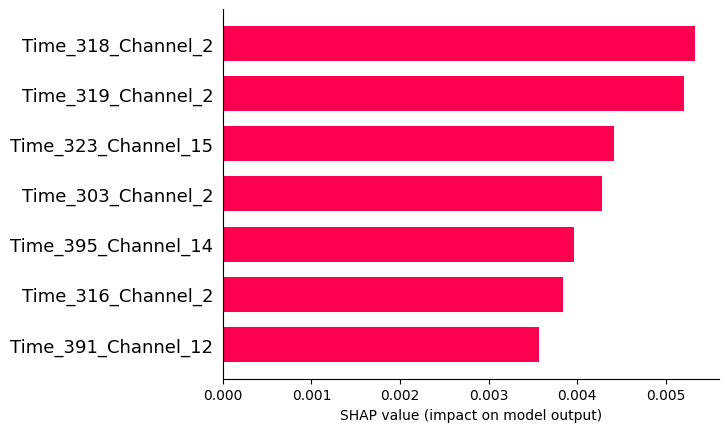

In [144]:
# Visualize the mean absolute SHAP values
shap.bar_plot(mean_abs_shap, feature_names=feature_names)

Class 0 Feature Importances:


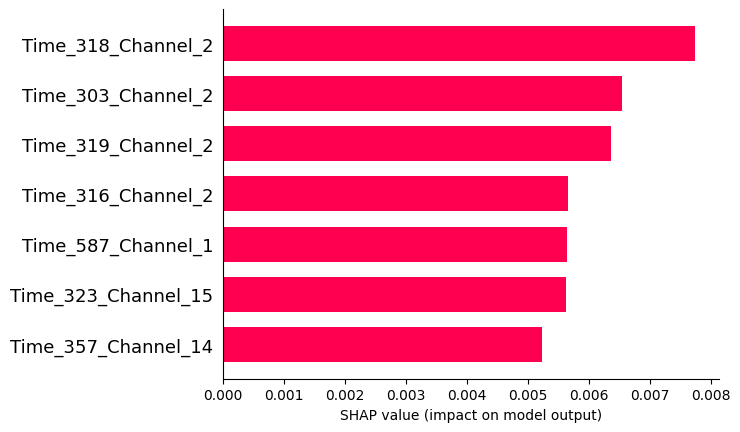

Class 1 Feature Importances:


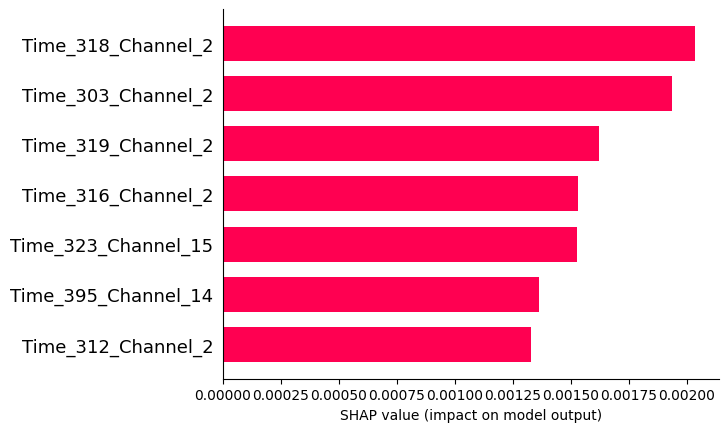

Class 2 Feature Importances:


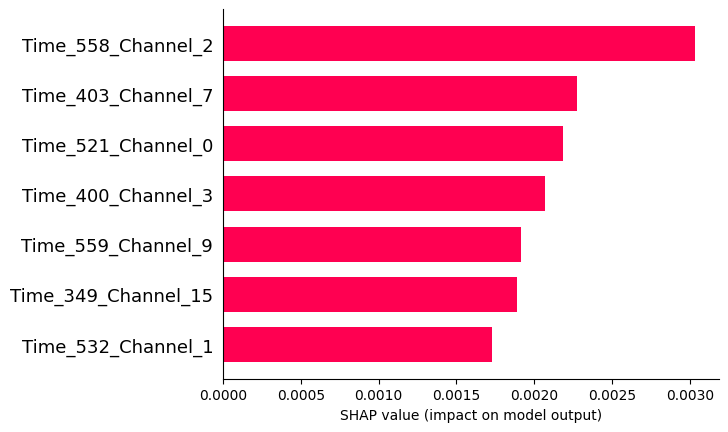

Class 3 Feature Importances:


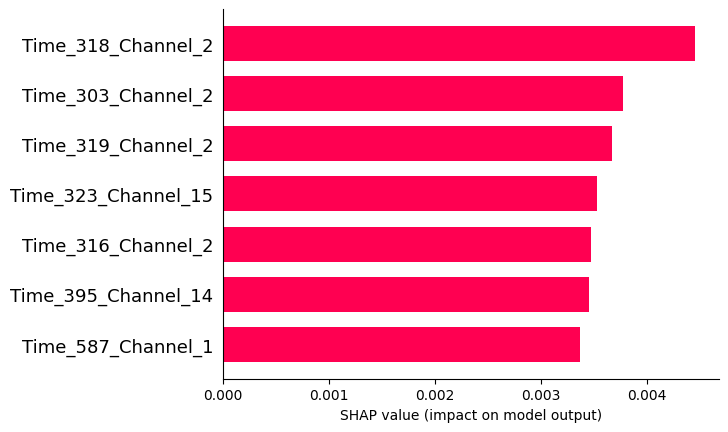

Class 4 Feature Importances:


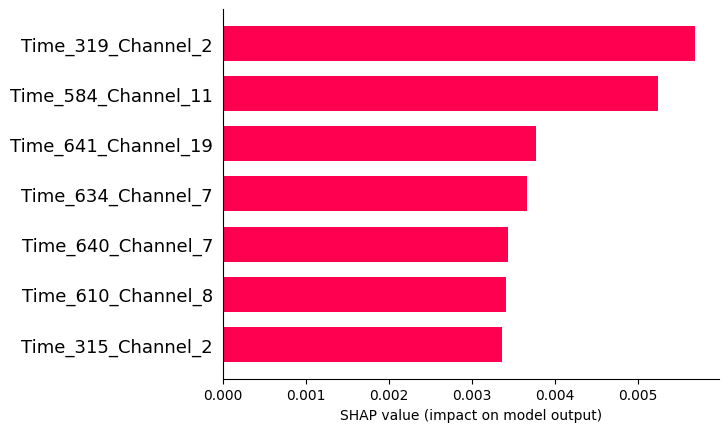

Class 5 Feature Importances:


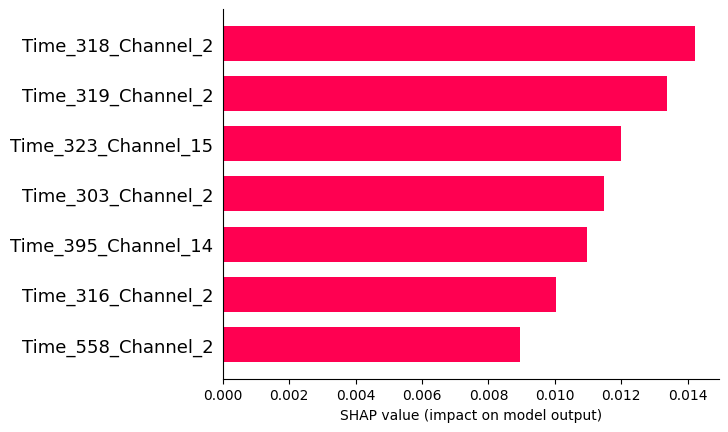

In [145]:
# Assuming shap_values is a list of SHAP values, one per class
# Reshape each class's SHAP values to 2D if they are not already
shap_values_reshaped_per_class = [values.reshape(values.shape[0], -1) for values in shap_values]

# Calculate the mean absolute SHAP values for each class
mean_abs_shap_per_class = [np.mean(np.abs(shap), axis=0) for shap in shap_values_reshaped_per_class]

# Generate feature names assuming 960 time steps and 20 channels
feature_names = [f"Time_{t}_Channel_{c}" for t in range(960) for c in range(20)]

# Plot mean absolute SHAP values for each class
for class_index, mean_abs_shap in enumerate(mean_abs_shap_per_class):
    print(f"Class {class_index} Feature Importances:")
    shap.bar_plot(mean_abs_shap, feature_names=feature_names)

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.


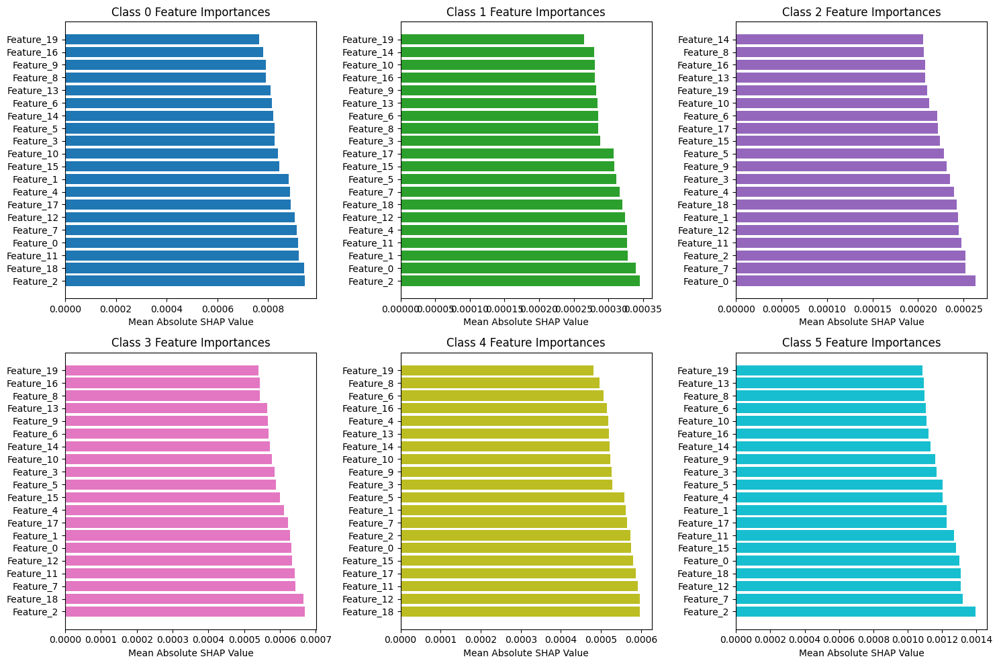

In [147]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming shap_values is a list of arrays, each with shape (128, 960, 20)
# Aggregate SHAP values over the samples for each class
mean_abs_shap_per_class = [np.mean(np.abs(values), axis=0) for values in shap_values]

# Flatten the SHAP values to be 1D per class
mean_abs_shap_per_class = [np.mean(values.reshape(values.shape[0], -1), axis=0) for values in mean_abs_shap_per_class]

# Generate feature names assuming 960 time steps and 20 channels
feature_names = [f"Feature_{i}" for i in range(mean_abs_shap_per_class[0].shape[0])]

# Determine the layout of your grid
num_classes = len(shap_values)
num_columns = 3  # You can choose how many columns you want
num_rows = num_classes // num_columns + (num_classes % num_columns > 0)

# Create a figure to hold the subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(num_columns * 5, num_rows * 5))

# Flatten the axes array for easy iteration
axs = axs.flatten()

# Define a list of colors for each class's bar graph
colors = plt.cm.get_cmap('tab10', num_classes)

# Plot mean absolute SHAP values for each class
for class_index, mean_abs_shap in enumerate(mean_abs_shap_per_class):
    ax = axs[class_index]
    sorted_indices = np.argsort(-mean_abs_shap)  # Get indices to sort the bars
    ax.barh(
        np.arange(len(feature_names)), 
        mean_abs_shap[sorted_indices], 
        color=colors(class_index)
    )
    ax.set_yticks(np.arange(len(feature_names)))
    ax.set_yticklabels(np.array(feature_names)[sorted_indices])
    ax.set_title(f'Class {class_index} Feature Importances')
    ax.set_xlabel('Mean Absolute SHAP Value')

# Hide any unused subplots
for ax in axs[num_classes:]:
    ax.axis('off')

# Adjust the layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()
